In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
import pickle
import corner


### load in dataresults for kepler1513

In [39]:
with open("datainfo_kepler1513.pkl", "rb") as f:
    datainfo = pickle.load(f)

curves = datainfo["curves"]
data_info = datainfo["data_info"]
tmids_lineph = [curve["tmidi"] for curve in curves]
info = datainfo["info"]
print(tmids)

[np.float64(277.50639), np.float64(438.39047800000003), np.float64(760.158654), np.float64(921.042742), np.float64(1081.9268299999999), np.float64(1242.810918), np.float64(1403.695006), np.float64(1564.579094)]


### load in vanilla mcmc

In [200]:
vanilla_posterior = az.from_netcdf("arviz_kepler1513_vanilla.nc")
burnin = info["burnin_van"]
vanilla_posterior = vanilla_posterior.sel(draw=slice(burnin, None))


In [201]:
vanilla_results = datainfo["vanilla_results"]
vanilla_alpha_samps = vanilla_results["alpha_samps_van"]
#vanilla_logprob = vanilla_results["log_prob_van"]




KeyError: 'log_prob_van'

In [199]:
print(vanilla_posterior.sample_stats)

<xarray.Dataset> Size: 49MB
Dimensions:  (chain: 60, draw: 100000)
Coordinates:
  * chain    (chain) int64 480B 0 1 2 3 4 5 6 7 8 ... 51 52 53 54 55 56 57 58 59
  * draw     (draw) int64 800kB 400000 400001 400002 ... 499997 499998 499999
Data variables:
    lp       (chain, draw) float64 48MB ...
Attributes:
    created_at:                 2025-11-25T18:50:14.777158+00:00
    arviz_version:              0.22.0
    inference_library:          emcee
    inference_library_version:  3.1.6


array([[<Axes: title={'center': 'x'}>, <Axes: title={'center': 'x'}>]],
      dtype=object)

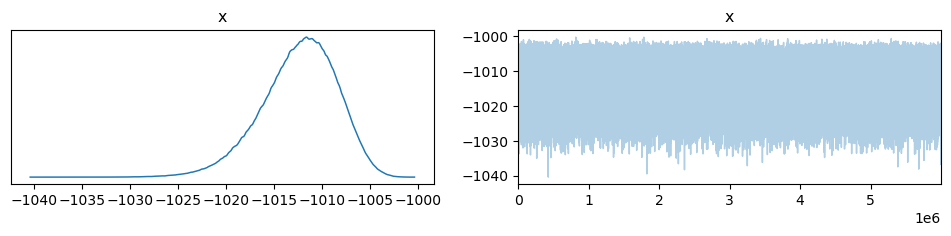

In [212]:
lp_van = vanilla_posterior.sample_stats["lp"]     # shape (chain, draw)

# flatten to shape (chain * draw,)
log_prob_flat_van = lp_van.values.reshape(-1)
az.plot_trace(log_prob_flat_van)


### load in linear mcmc

In [204]:
linear_posterior = az.from_netcdf("arviz_kepler1513_linear.nc")
burnin = info["burnin"]
linear_posterior = linear_posterior.sel(draw=slice(burnin, None))
lp_lin = linear_posterior.sample_stats["lp"]     # shape (chain, draw)


In [205]:
linear_results = datainfo["linear_results"]
linear_alpha_samps = linear_results["linear_alpha_samples"]
linear_logprob = linear_results["linear_logprob"]


In [206]:
print(linear_logprob.shape)

(140000,)


In [20]:
print(linear_posterior.posterior)

<xarray.Dataset> Size: 146MB
Dimensions:   (chain: 28, draw: 50000)
Coordinates:
  * chain     (chain) int64 224B 0 1 2 3 4 5 6 7 8 ... 20 21 22 23 24 25 26 27
  * draw      (draw) int64 400kB 250000 250001 250002 ... 299997 299998 299999
Data variables: (12/13)
    tmid0     (chain, draw) float64 11MB ...
    tmid1     (chain, draw) float64 11MB ...
    tmid2     (chain, draw) float64 11MB ...
    tmid3     (chain, draw) float64 11MB ...
    tmid4     (chain, draw) float64 11MB ...
    tmid5     (chain, draw) float64 11MB ...
    ...        ...
    tmid7     (chain, draw) float64 11MB ...
    p         (chain, draw) float64 11MB ...
    b         (chain, draw) float64 11MB ...
    ln_rho_s  (chain, draw) float64 11MB ...
    q1        (chain, draw) float64 11MB ...
    q2        (chain, draw) float64 11MB ...
Attributes:
    created_at:                 2025-11-25T18:49:54.125224+00:00
    arviz_version:              0.22.0
    inference_library:          emcee
    inference_library_ve

array([[<Axes: title={'center': 'lp'}>, <Axes: title={'center': 'lp'}>]],
      dtype=object)

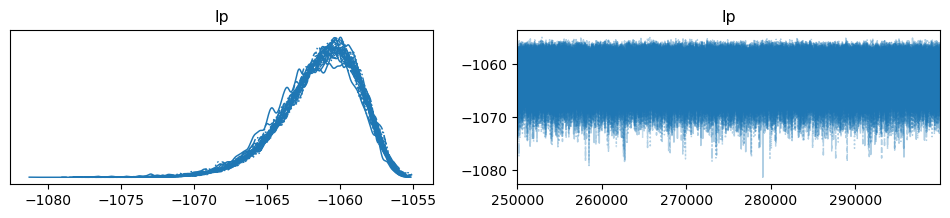

In [210]:
az.plot_trace(linear_posterior.sample_stats, var_names=["lp"])


## load in nonlinear mcmc

In [21]:
nonlinear_posterior = az.from_netcdf("arviz_kepler1513_nonlinear.nc")
burnin = info["burnin"]
nonlinear_posterior = nonlinear_posterior.sel(draw=slice(burnin, None))

In [197]:
nonlinear_results = datainfo["nonlinear_results"]
nonlinear_tmid = nonlinear_results["nonlinear_psi_samps"]
nonlinear_alpha_samps = nonlinear_results["nonlinear_alpha_samples"]
nonlinear_logprob = nonlinear_results["nonlinear_logprob"]

In [23]:
print(nonlinear_posterior.posterior)
print(nonlinear_posterior.sample_stats)

<xarray.Dataset> Size: 24MB
Dimensions:   (chain: 12, draw: 50000)
Coordinates:
  * chain     (chain) int64 96B 0 1 2 3 4 5 6 7 8 9 10 11
  * draw      (draw) int64 400kB 250000 250001 250002 ... 299997 299998 299999
Data variables:
    p         (chain, draw) float64 5MB ...
    b         (chain, draw) float64 5MB ...
    ln_rho_s  (chain, draw) float64 5MB ...
    q1        (chain, draw) float64 5MB ...
    q2        (chain, draw) float64 5MB ...
Attributes:
    created_at:                 2025-11-25T18:49:48.067897+00:00
    arviz_version:              0.22.0
    inference_library:          emcee
    inference_library_version:  3.1.6
<xarray.Dataset> Size: 5MB
Dimensions:  (chain: 12, draw: 50000)
Coordinates:
  * chain    (chain) int64 96B 0 1 2 3 4 5 6 7 8 9 10 11
  * draw     (draw) int64 400kB 250000 250001 250002 ... 299997 299998 299999
Data variables:
    lp       (chain, draw) float64 5MB ...
Attributes:
    created_at:                 2025-11-25T18:49:47.867639+00:00
    ar

array([[<Axes: title={'center': 'lp'}>, <Axes: title={'center': 'lp'}>]],
      dtype=object)

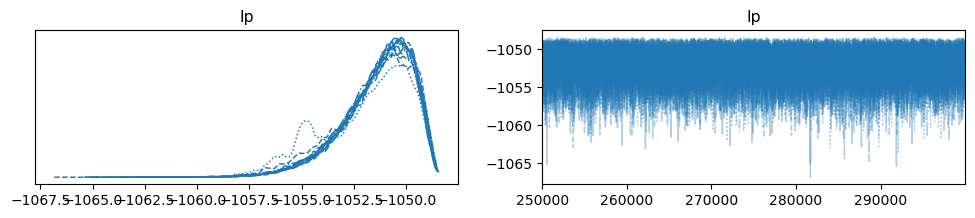

In [213]:
az.plot_trace(nonlinear_posterior.sample_stats, var_names=["lp"])


### load in daniel_posterior

In [9]:
import arviz as az
import numpy as np

daniel_posterior = az.from_netcdf('./kepler1513_transit_posterior.out')
print(daniel_posterior.posterior)


<xarray.Dataset> Size: 2MB
Dimensions:             (chain: 2, draw: 2000, tts_0_dim_0: 10,
                         transit_inds_dim_0: 10, t0_dim_0: 1, period_dim_0: 1,
                         ttvs_0_dim_0: 10)
Coordinates:
  * chain               (chain) int64 16B 0 1
  * draw                (draw) int64 16kB 0 1 2 3 4 ... 1995 1996 1997 1998 1999
  * tts_0_dim_0         (tts_0_dim_0) int64 80B 0 1 2 3 4 5 6 7 8 9
  * transit_inds_dim_0  (transit_inds_dim_0) int64 80B 0 1 2 3 4 5 6 7 8 9
  * t0_dim_0            (t0_dim_0) int64 8B 0
  * period_dim_0        (period_dim_0) int64 8B 0
  * ttvs_0_dim_0        (ttvs_0_dim_0) int64 80B 0 1 2 3 4 5 6 7 8 9
Data variables: (12/20)
    log_rho_star        (chain, draw) float64 32kB ...
    rho_star            (chain, draw) float64 32kB ...
    b                   (chain, draw) float64 32kB ...
    tts_0               (chain, draw, tts_0_dim_0) float64 320kB ...
    transit_inds        (chain, draw, transit_inds_dim_0) int64 320kB ...
    ror

#### table of daniel_posterior values

In [10]:
import arviz as az

az.summary(daniel_posterior,var_names=[
    "ror",
    "rho_star",
    "b",
    "Kepler_q1",
    "Kepler_q2",
    "TESS_q1",
    "TESS_q2",
    "TESS_blend",
    "tts_0",
    "t0",
    "period",
        ])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ror,0.079,0.000,0.078,0.079,0.000,0.000,1024.0,660.0,1.0
rho_star,1.292,0.038,1.214,1.339,0.001,0.002,1048.0,660.0,1.0
b,0.114,0.074,0.000,0.244,0.003,0.002,804.0,638.0,1.0
Kepler_q1,0.453,0.040,0.379,0.528,0.001,0.001,1882.0,2075.0,1.0
Kepler_q2,0.325,0.029,0.269,0.378,0.001,0.001,2449.0,2006.0,1.0
TESS_q1,0.126,0.123,0.000,0.354,0.002,0.003,4060.0,2202.0,1.0
TESS_q2,0.280,0.245,0.000,0.774,0.004,0.004,4201.0,2509.0,1.0
TESS_blend,1.000,0.000,1.000,1.000,0.000,0.000,2907.0,1478.0,1.0
tts_0[0],277.506,0.000,277.505,277.506,0.000,0.000,3999.0,2702.0,1.0
tts_0[1],438.388,0.000,438.387,438.389,0.000,0.000,3996.0,2784.0,1.0


#### get median and +/- 1$\sigma$ tmid values from each one

In [92]:

###daniel calc
tts_d_median = []
t0_d_median = np.median(daniel_posterior.posterior["t0"].values)

tts_d_err = []
for ii in range(0, 8):
    tts_d = np.median(daniel_posterior.posterior["tts_0"].values[:, :, ii])
    tts_d_median.append(tts_d)
    
    
    tts_d_quantile = [np.quantile(daniel_posterior.posterior["tts_0"].values[:, :, ii], 0.16),
                    np.quantile(daniel_posterior.posterior["tts_0"].values[:, :, ii], 0.84)]
    
    tts_d_err.append(np.array([
        tts_d - tts_d_quantile[0],
        tts_d_quantile[1] - tts_d
    ]))
    
    print(tts_d, tts_d_err[ii])
    

tts_d_err = np.array(tts_d_err).T

###vanilla calc

tts_v_median = []
t0_v_median = 277.506

tts_v_err = []
for ii in range(0, 8):
    tts_v = np.median(vanilla_posterior.posterior[f"tmid{ii}"].values)
    tts_v_median.append(tts_v)
    
    
    tts_v_quantile = [np.quantile(vanilla_posterior.posterior[f"tmid{ii}"].values, 0.16),
                    np.quantile(vanilla_posterior.posterior[f"tmid{ii}"].values, 0.84)]
    
    tts_v_err.append(np.array([
        tts_v - tts_v_quantile[0],
        tts_v_quantile[1] - tts_v
    ]))
    
    print(f"vanilla: relative tmid{ii} {tts_v}, and 1 sigma {tts_v_err[ii]}")
    

tts_v_err = np.array(tts_v_err).T

###linear calc

tts_l_median = []
t0_l_median = 277.506

tts_l_err = []
for ii in range(0, 8):
    tts_l = np.median(linear_posterior.posterior[f"tmid{ii}"].values)
    tts_l_median.append(tts_l)
    
    
    tts_l_quantile = [np.quantile(linear_posterior.posterior[f"tmid{ii}"].values, 0.16),
                    np.quantile(linear_posterior.posterior[f"tmid{ii}"].values, 0.84)]
    
    tts_l_err.append(np.array([
        tts_l - tts_l_quantile[0],
        tts_l_quantile[1] - tts_l
    ]))
    
    print(f"linear: relative tmid{ii} {tts_l}, and 1 sigma {tts_l_err[ii]}")
    

tts_l_err = np.array(tts_l_err).T


###nonlinear calc

tts_nl_median = []
t0_nl_median = 277.506

tts_nl_err = []
for ii in range(0, 8):
    tts_nl = np.median(nonlinear_tmid)
    tts_nl_median.append(tts_nl)
    
    
    tts_nl_quantile = [np.quantile(nonlinear_tmid, 0.16),
                    np.quantile(nonlinear_tmid, 0.84)]
    
    tts_nl_err.append(np.array([
        tts_nl - tts_nl_quantile[0],
        tts_nl_quantile[1] - tts_nl
    ]))
    
    print(f"nonlinear: relative tmid{ii} {tts_nl}, and 1 sigma {tts_nl_err[ii]}")
    

tts_nl_err = np.array(tts_nl_err).T



277.5056279571054 [0.00037534 0.00040132]
438.3877701232243 [0.00045058 0.00042884]
760.1546033967913 [0.00046111 0.00045595]
921.0457522675113 [0.00038826 0.00041212]
1081.9294412527865 [0.00041157 0.00040395]
1242.8089948589727 [0.00034869 0.00035472]
1403.7018577677827 [0.00043503 0.00043351]
1564.5776120989847 [0.00035384 0.00037547]
vanilla: relative tmid0 0.00012621260521820664, and 1 sigma [0.00035007 0.00035402]
vanilla: relative tmid1 -0.0018789415166606419, and 1 sigma [0.0003523  0.00035534]
vanilla: relative tmid2 -0.005091890981186049, and 1 sigma [0.00035333 0.00034901]
vanilla: relative tmid3 0.003102504916617883, and 1 sigma [0.00034151 0.00034634]
vanilla: relative tmid4 0.0021022100290354366, and 1 sigma [0.00037532 0.0003739 ]
vanilla: relative tmid5 -0.0017870873793462843, and 1 sigma [0.0003454  0.00034549]
vanilla: relative tmid6 0.007349356041163369, and 1 sigma [0.00035637 0.00035879]
vanilla: relative tmid7 -0.001513023016840232, and 1 sigma [0.00034794 0.00034

#### make corner plots

In [195]:
print(vanilla_results["alpha_samps_van"][590000:].shape)
print(linear_results["linear_alpha_samples"][130000:].shape)
print(nonlinear_results["nonlinear_alpha_samples"][50000:].shape)

(10000, 5)
(10000, 5)
(10000, 5)


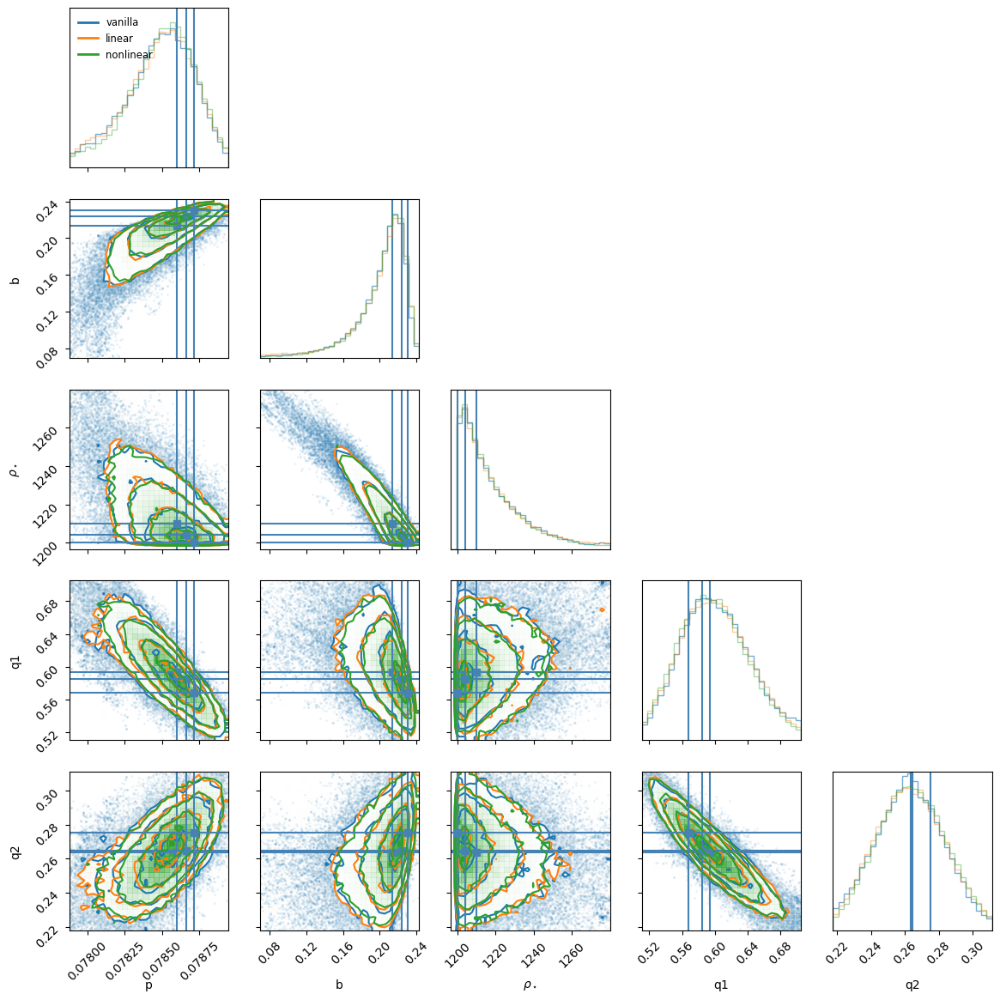

In [196]:
from matplotlib.lines import Line2D

    
datasets = []
datasets.append(("vanilla", vanilla_results["alpha_samps_van"][550000:], 
                         vanilla_results["best_alpha_sample_van"]))

datasets.append(("linear", linear_results["linear_alpha_samples"][90000:], 
                     linear_results["linear_best_alpha_samp"]))

datasets.append(("nonlinear", nonlinear_results["nonlinear_alpha_samples"][10000:], 
                     nonlinear_results["nonlinear_best_alpha_samp"]))



raw_labels = info["alpha_names"]
labels = [r"$\rho_\star$" if name == "ln_rho_s" else name for name in raw_labels]
colors = ["C0", "C1", "C2"]

ranges = []
for i in range(len(labels)):
    x = np.concatenate([arr[:, i] for _, arr, _ in datasets])
    lo, hi = np.percentile(x, [2.5, 97.5])
    pad = 0.05 * (hi - lo) if hi > lo else 1e-6
    ranges.append((lo - pad, hi + pad)) 

fig = None
for i, (variation, samples, truths_vec) in enumerate(datasets):
    kwargs = dict(labels=labels, color=colors[i], bins=30, range=ranges)
    kwargs["truths"] = truths_vec
    if fig is None:
        fig = corner.corner(
            samples, show_titles=False, title_fmt=".2f",
            hist_kwargs={"alpha": 0.6, "density" : True},
            contour_kwargs={"colors": [colors[i]]},
            **kwargs
        )
    else:
        fig = corner.corner(
            samples, fig=fig, plot_datapoints=False, show_titles=False,
            hist_kwargs={"alpha": 0.4, "density" : True},
            contour_kwargs={"colors": [colors[i]]},
            **kwargs
        )
if fig is not None and fig.axes:
    ax0 = fig.axes[0]
    handles = [Line2D([0],[0], color=colors[i], lw=2, label=name) for i,(name,_,_) in enumerate(datasets)]
    ax0.legend(handles=handles, frameon=False, fontsize="small")

plt.tight_layout()
plt.show()  


(60000, 5) (140000, 5) (600000, 5)


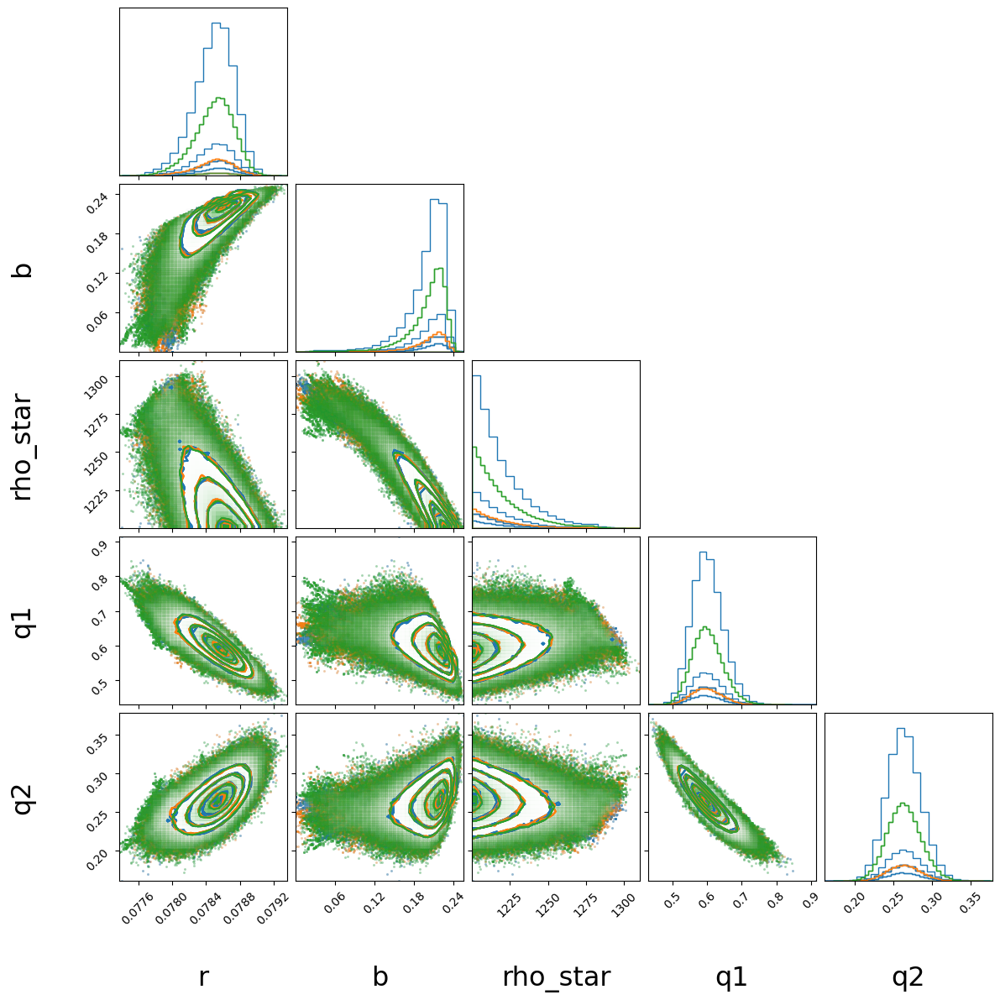

In [171]:
import corner
import matplotlib 
matplotlib.rc('text', usetex=False)


names = ["r",
    "b",
    "rho_star",
    "q1",
    "q2"
    ]
print(nonlinear_alpha_samps.shape, linear_alpha_samps.shape, vanilla_alpha_samps.shape)
fig = corner.corner(
    nonlinear_alpha_samps,
    fig = fig,
    color = 'C0',
   # hist_kwargs={"alpha": 0.6, "density" : True},
    labels=names,
    bins=40,
    label_kwargs={'fontsize':23}, labelpad=0.2
)
corner.corner(
    linear_alpha_samps,
    labels=names,
    fig = fig,
    color = 'C1',
    bins=40,
    #hist_kwargs={"alpha": 0.6, "density" : True},
    label_kwargs={'fontsize':23}, labelpad=0.2)

corner.corner(
    vanilla_alpha_samps,
    labels=names,
    fig = fig,
    bins=40,
    color = 'C2',
    #hist_kwargs={"alpha": 0.6, "density" : True},
    label_kwargs={'fontsize':23}, labelpad=0.2)




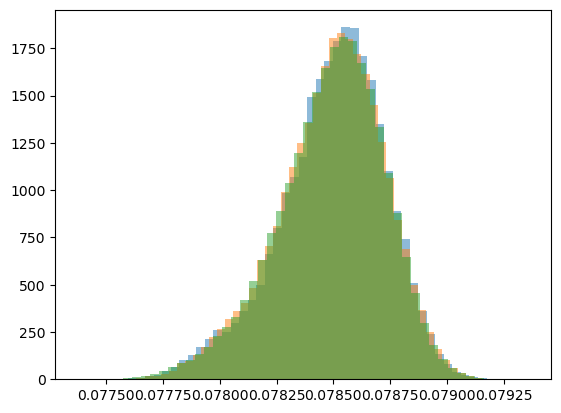

In [167]:

plt.hist(nonlinear_alpha_samps[:,0], bins=50, density=True, alpha=0.5)
plt.hist(linear_alpha_samps[:,0], bins=50, density=True, alpha=0.5)
plt.hist(vanilla_alpha_samps[:,0], bins=50, density=True, alpha=0.5)
plt.show()


In [170]:
print(
    np.median(nonlinear_alpha_samps[:,2]),
    np.median(linear_alpha_samps[:,2]),
    np.median(vanilla_alpha_samps[:,2]),
)

1213.3935808520403 1213.6273181622369 1213.6231345577332


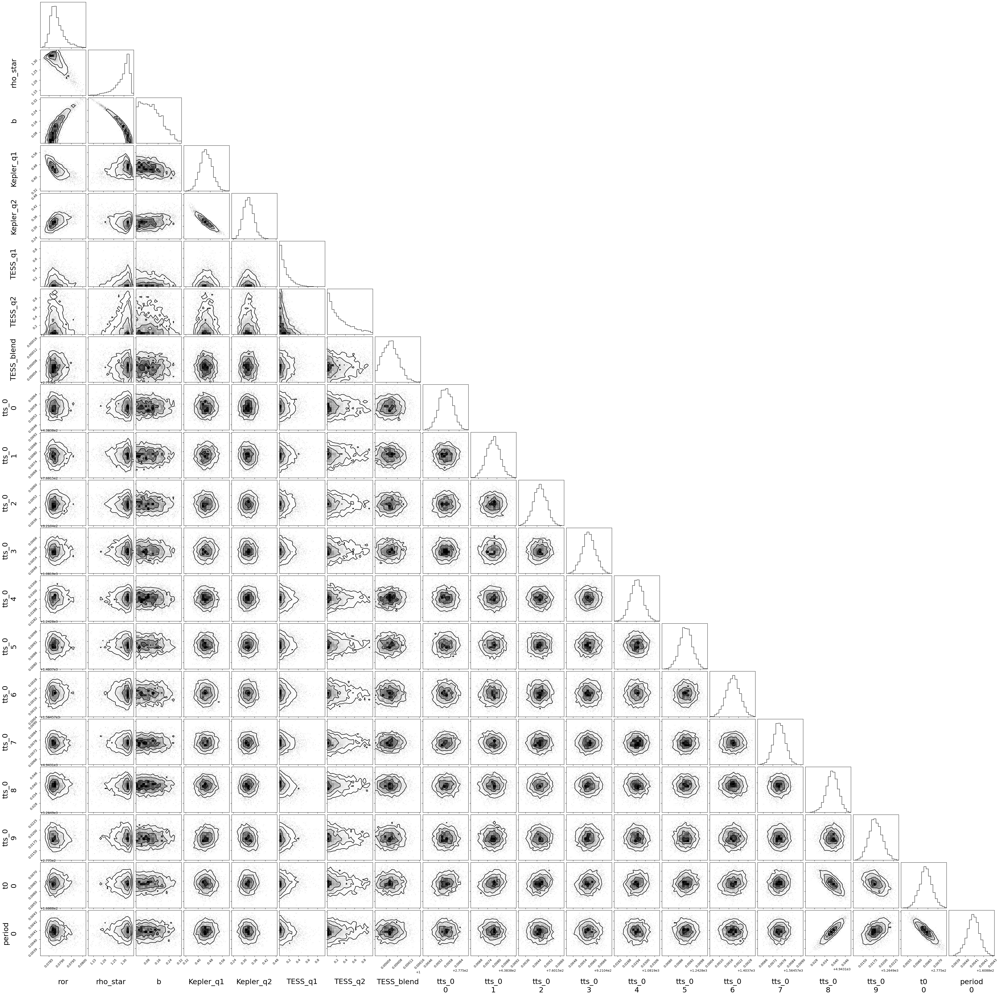

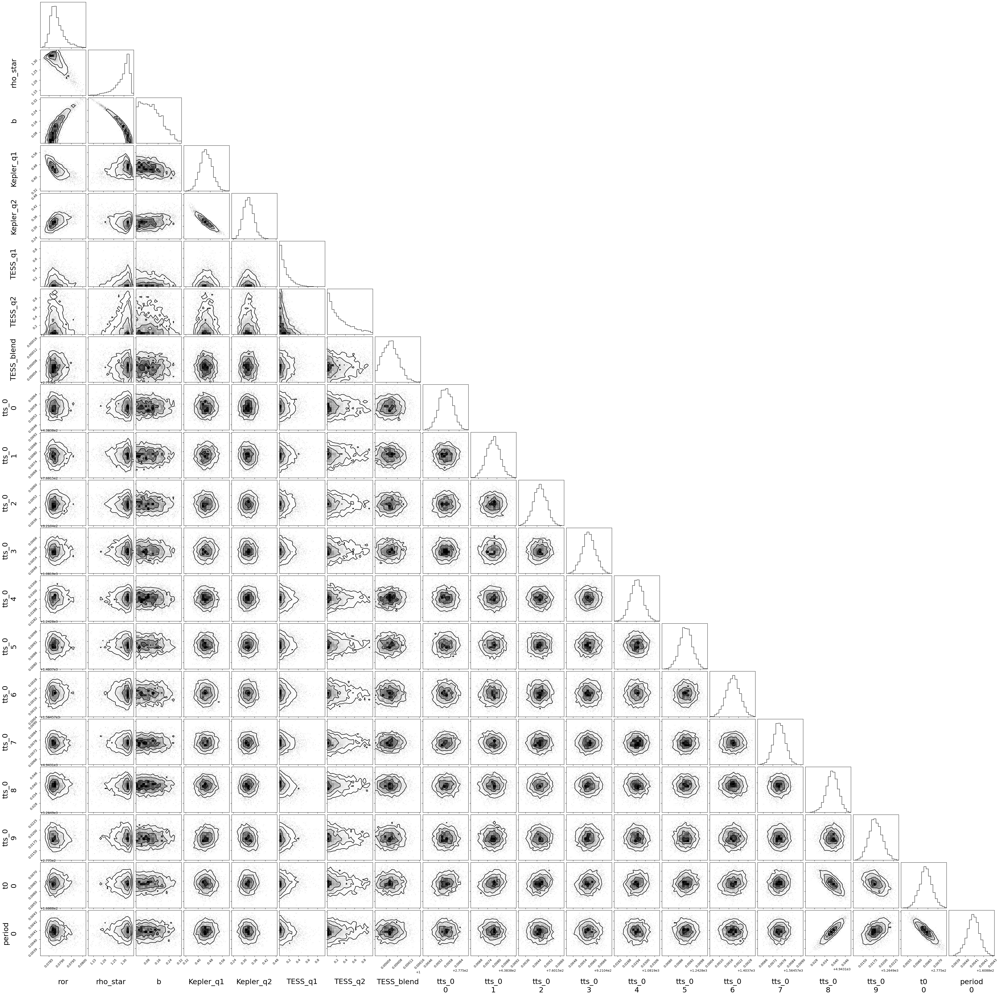

In [12]:
import corner
import matplotlib 
matplotlib.rc('text', usetex=False)


names = ["ror",
    "rho_star",
    "b",
    "Kepler_q1",
    "Kepler_q2",
    "TESS_q1",
    "TESS_q2",
    "TESS_blend",
    "tts_0",
    "t0",
    "period"]

corner.corner(
    daniel_posterior,
    var_names=names,
    label_kwargs={'fontsize':23}, labelpad=0.2
)




In [ ]:
###organize tmids

In [88]:
dan_vals = daniel_posterior.posterior["tts_0"].values
nchain, ndraw, ncurves_dan = dan_vals.shape
dan_samples = dan_vals.reshape(-1, ncurves_dan)
tmid_dan_samples = dan_samples[:, :-2]   # drop last 2 columns

ncurves = info["ncurves"]

print(f"ncurves is {ncurves}")

tmid_van_samples = np.vstack([tmids_lineph[i]+
    vanilla_posterior.posterior[f"tmid{i}"].values.reshape(-1)
    for i in range(ncurves)
]).T


tmid_lin_samples = np.vstack([tmids_lineph[i]+
    linear_posterior.posterior[f"tmid{i}"].values.reshape(-1)
    for i in range(ncurves)
]).T

tmid_nonlin_samples = np.asarray([tmids_lineph[i] + nonlinear_tmid for i in range(ncurves)])


print(tmid_dan_samples.shape)
print(tmid_van_samples.shape)
print(tmid_lin_samples.shape)

ncurves is 8
(4000, 8)
(6000000, 8)
(1400000, 8)


#### make corner plots, tmids only

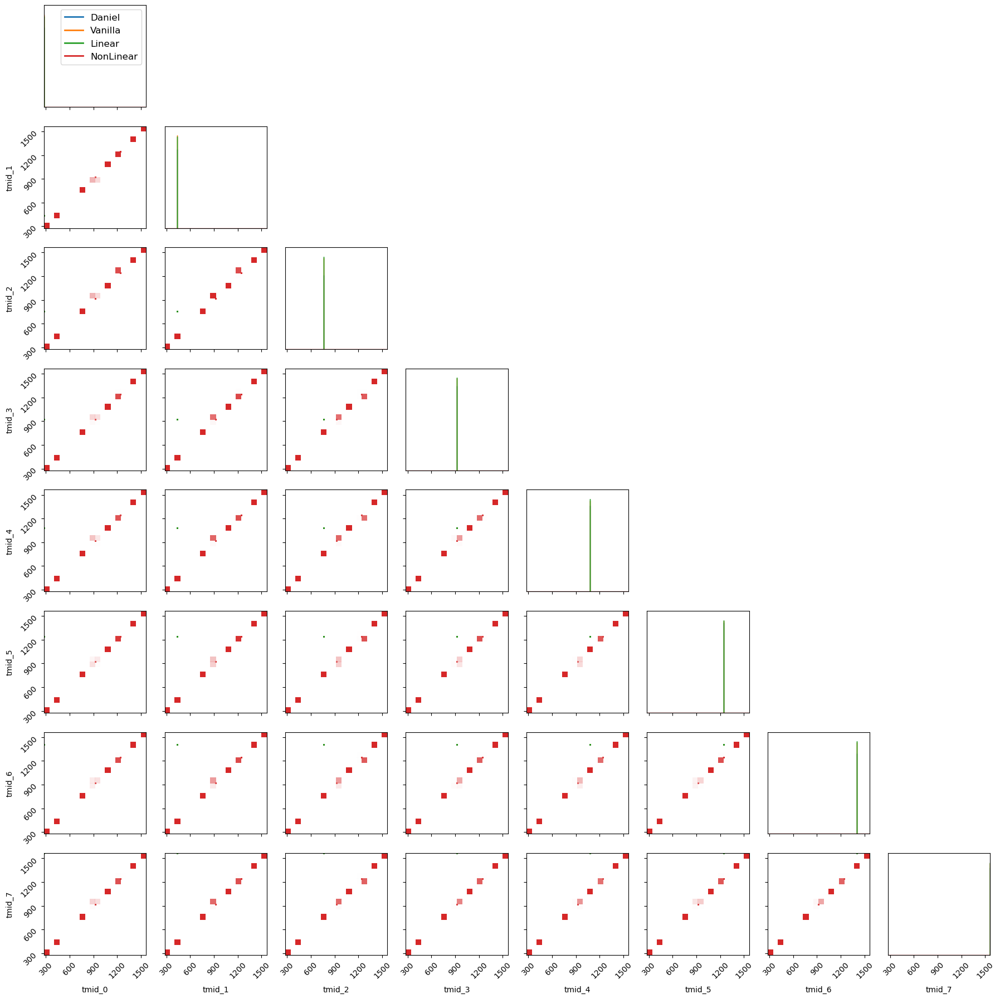

In [89]:
labels = [f"tmid_{i}" for i in range(ncurves)]

fig = corner.corner(
    tmid_dan_samples,
    labels=labels,
    color="C0",
    plot_contours=True,
    hist_kwargs={"density": True},
)

corner.corner(
    tmid_van_samples,
    labels=labels,
    color="C1",
    fig=fig,
    plot_contours=True,
    hist_kwargs={"density": True},
)

corner.corner(
    tmid_lin_samples,
    labels=labels,
    color="C2",
    fig=fig,
    plot_contours=True,
    hist_kwargs={"density": True},
)

corner.corner(
    tmid_nonlin_samples,
    labels=labels,
    color="C3",
    fig=fig,
    plot_contours=True,
    hist_kwargs={"density": True},
)

axes = np.array(fig.axes).reshape((ncurves, ncurves))
ax_diag = axes[0, 0]

legend_lines = [
    plt.Line2D([], [], color="C0", linewidth=2, label="Daniel"),
    plt.Line2D([], [], color="C1", linewidth=2, label="Vanilla"),
    plt.Line2D([], [], color="C2", linewidth=2, label="Linear"),
    plt.Line2D([], [], color="C3", linewidth=2, label="NonLinear"),
]

ax_diag.legend(handles=legend_lines, fontsize=12, loc="upper right")

plt.tight_layout()
plt.show()

In [ ]:
###plot tmid histograms only

In [29]:
print(nonlinear_tmid)

[[ 1.47433074e-04 -1.90864753e-03 -5.10990152e-03 ... -1.74438525e-03
   7.37819413e-03 -1.49421329e-03]
 [ 8.54667418e-05 -1.87134055e-03 -5.05227753e-03 ... -1.80093844e-03
   7.32122867e-03 -1.54786832e-03]
 [ 1.29650005e-04 -1.86294218e-03 -5.07158416e-03 ... -1.79962846e-03
   7.35934730e-03 -1.52280242e-03]
 ...
 [ 1.16483198e-04 -1.84827600e-03 -5.06158264e-03 ... -1.81054952e-03
   7.31914154e-03 -1.53593950e-03]
 [ 1.38741589e-04 -1.91917273e-03 -5.09620882e-03 ... -1.75710494e-03
   7.37859269e-03 -1.51074819e-03]
 [ 1.32388252e-04 -1.87722372e-03 -5.10945423e-03 ... -1.77268638e-03
   7.35849216e-03 -1.49498965e-03]]


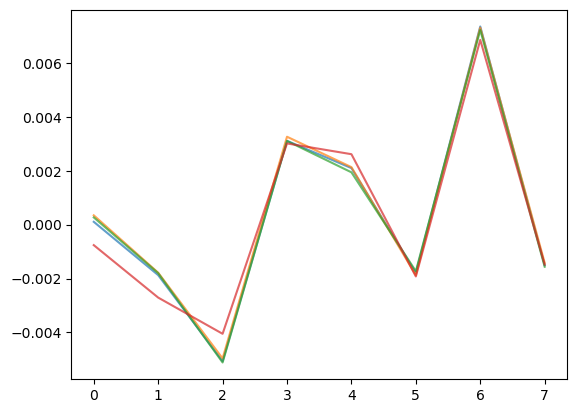

In [85]:
###plot time from linear ephemeris
linear_results = datainfo["linear_results"]
vanilla_results = datainfo["vanilla_results"]
best_tmids_nonlinear = nonlinear_results["nonlinear_best_psi_samp"]
best_tmids_linear = linear_results["linear_bestpsi"]
best_tmids_vanilla = vanilla_results["best_psi_sample_van"]
best_tmids_daniel_rel = np.asarray(tts_d_median) - np.asarray(tmids_lineph) 

tts_d_err
tts_v_err
tts_l_err
tts_nl_err

plt.plot(np.arange(len(best_tmids_nonlinear)), best_tmids_nonlinear, alpha = .7)
plt.plot(np.arange(len(best_tmids_linear)), best_tmids_linear, alpha = .7)
plt.plot(np.arange(len(best_tmids_vanilla)), best_tmids_vanilla, alpha = .7)
plt.plot(np.arange(len(best_tmids_daniel_rel)), best_tmids_daniel_rel, alpha = .7)

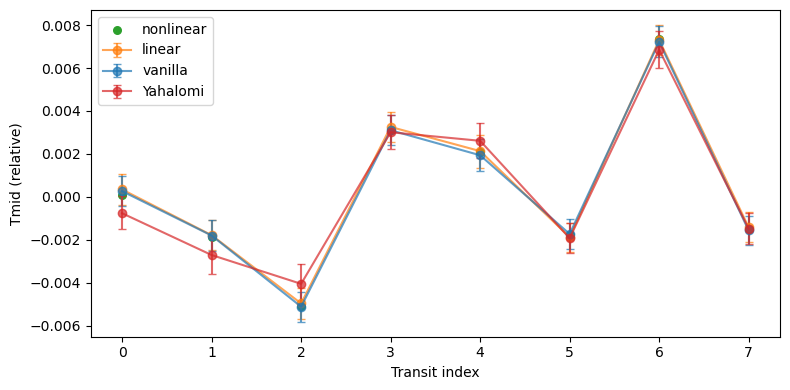

In [185]:
x = np.arange(len(best_tmids_nonlinear))
nstd = 2

plt.figure(figsize=(8, 4))

plt.scatter(
    x, best_tmids_nonlinear, label="nonlinear", color='C2', s= 30, alpha = 1
)
plt.errorbar(
    x, best_tmids_linear, yerr=nstd*tts_l_err,
    fmt='-o', capsize=3, alpha=0.7, label="linear", color='C1'
)
plt.errorbar(
    x, best_tmids_vanilla, yerr=nstd*tts_v_err,
    fmt='-o', capsize=3, alpha=0.7, label="vanilla", color='C0'
)
plt.errorbar(
    x, best_tmids_daniel_rel, yerr=nstd*tts_d_err,
    fmt='-o', capsize=3, alpha=0.7, label="Yahalomi", color='C3'
)

plt.xlabel("Transit index")
plt.ylabel("Tmid (relative)")
plt.legend()
plt.tight_layout()
plt.show()

[np.float64(277.50639), np.float64(438.39047800000003), np.float64(760.158654), np.float64(921.042742), np.float64(1081.9268299999999), np.float64(1242.810918), np.float64(1403.695006), np.float64(1564.579094)]
277.50639
438.39047800000003
760.158654
921.042742
1081.9268299999999
1242.810918
1403.695006
1564.579094


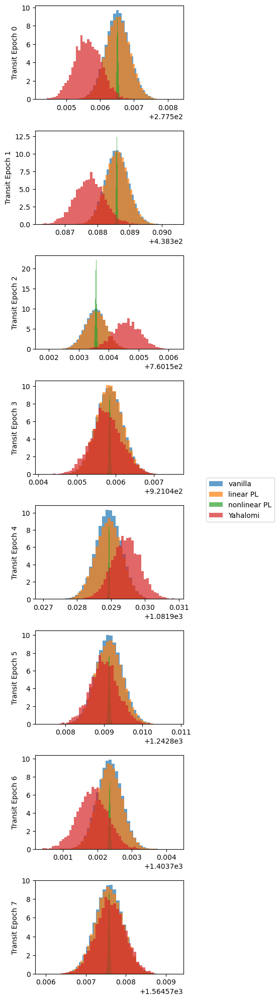

In [186]:
print(tmids_lineph)
import matplotlib.ticker as mtick
labels = [f"Transit Epoch {i}" for i in range(ncurves)]
fig, axes = plt.subplots(nrows=ncurves, ncols=1, figsize=(4, 2.5 * ncurves), sharex=False)
if ncurves == 1:
    axes = [axes]
for i, ax in enumerate(axes):
    print(tmids_lineph[i])
    ax.hist(tmid_van_samples[:, i], weights=np.ones_like(tmid_van_samples[:, i], dtype=float)/tmid_van_samples[:, i].size*100, bins=40, alpha=0.7, label="vanilla", color='C0') #divide all the samples by number of datapoints * 100
    ax.hist(tmid_lin_samples[:, i], weights=np.ones_like(tmid_lin_samples[:, i], dtype=float)/tmid_lin_samples[:, i].size*100, bins=40, alpha=0.7, label="linear PL", color='C1')
    ax.hist((nonlinear_tmid[:, i] + tmids_lineph[i]), weights=np.ones_like(nonlinear_tmid[:, i], dtype=float)/nonlinear_tmid[:, i].size*100, bins=40, alpha=0.7, label="nonlinear PL", color='C2')
    ax.hist(tmid_dan_samples[:, i], weights=np.ones_like(tmid_dan_samples[:, i], dtype=float)/tmid_dan_samples[:, i].size*100, bins=40, alpha=0.7, label="Yahalomi", color='C3')    

    ax.set_ylabel(labels[i])

handles, labels_legend = axes[0].get_legend_handles_labels()
fig.legend(handles, labels_legend,
           loc='center left',
           bbox_to_anchor=(1.02, 0.5))
plt.subplots_adjust(right=0.8)

plt.tight_layout()
plt.show()


### scaled nonlinear graph

[np.float64(277.50639), np.float64(438.39047800000003), np.float64(760.158654), np.float64(921.042742), np.float64(1081.9268299999999), np.float64(1242.810918), np.float64(1403.695006), np.float64(1564.579094)]
16.080773626007307
18.319831992899804
11.620122142464087
15.058477902104094
21.251254702305978
13.590982979171434
14.590389573411194
14.175949574391847


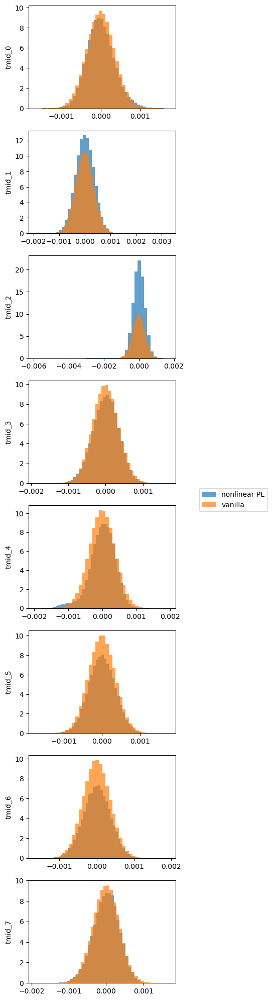

In [151]:
print(tmids_lineph)
import matplotlib.ticker as mtick
labels = [f"tmid_{i}" for i in range(ncurves)]
fig, axes = plt.subplots(nrows=ncurves, ncols=1, figsize=(4, 2.5 * ncurves), sharex=False)
if ncurves == 1:
    axes = [axes]
for i, ax in enumerate(axes):


    tmid_nonlin_samples = nonlinear_tmid[:, i] + tmids_lineph[i]
    tmid_0_samps = tmid_nonlin_samples - np.mean(tmid_nonlin_samples)
    tmid_nonlin_fsamps = tmid_0_samps
    tmid_van_samps = tmid_van_samples[:, i] - np.mean(tmid_van_samples[:, i])


    sf = np.std(tmid_van_samps) / np.std(tmid_0_samps)
    print(sf)
   

    tmid_nonlin_fsamps = sf * tmid_0_samps
    ax.hist(tmid_nonlin_fsamps, weights=np.ones_like(tmid_nonlin_fsamps, dtype=float)/tmid_nonlin_fsamps.size*100, bins=40, alpha=0.7, label="nonlinear PL")


    ax.hist(tmid_van_samps, weights=np.ones_like(tmid_van_samps, dtype=float)/tmid_van_samps.size*100, bins=40, alpha=0.7, label="vanilla") #divide all the samples by number of datapoints * 100
    
    
    #ax.hist(tmid_van_samps[:, i], weights=np.ones_like(tmid_van_samps[:, i], dtype=float)/tmid_van_samps[:, i].size*100, bins=40, alpha=0.7, label="vanilla") #divide all the samples by number of datapoints * 100
    #ax.hist(tmid_lin_samples[:, i], weights=np.ones_like(tmid_lin_samples[:, i], dtype=float)/tmid_lin_samples[:, i].size*100, bins=40, alpha=0.7, label="linear PL")
    #ax.hist(tmid_0_samples, weights=np.ones_like(nonlinear_tmid[:, i], dtype=float)/nonlinear_tmid[:, i].size*100, bins=40, alpha=0.7, label="nonlinear PL")
    #ax.hist(tmid_dan_samples[:, i], weights=np.ones_like(tmid_dan_samples[:, i], dtype=float)/tmid_dan_samples[:, i].size*100, bins=40, alpha=0.7, label="Yahalomi")    

    ax.set_ylabel(labels[i])

handles, labels_legend = axes[0].get_legend_handles_labels()
fig.legend(handles, labels_legend,
           loc='center left',
           bbox_to_anchor=(1.02, 0.5))
plt.subplots_adjust(right=0.8)

plt.tight_layout()
plt.show()


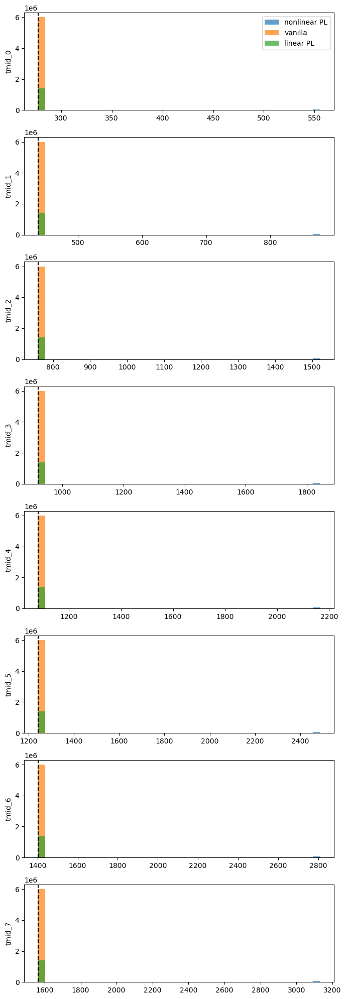

In [125]:
labels = [f"tmid_{i}" for i in range(ncurves)]
fig, axes = plt.subplots(nrows=ncurves, ncols=1, figsize=(7, 2.5*ncurves), sharex=False)
if ncurves == 1:
    axes = [axes]

for i, ax in enumerate(axes):
    sf = 15
    nonlin_tmid_scaled = best_tmids_nonlinear[i] + sf*(nonlinear_tmid[:, i] - np.median(nonlinear_tmid[:, i])) + tmids_lineph[i]
    nonlin_tmid_scaled
    x_non = nonlin_tmid_scaled + tmids_lineph[i]
    x_van = tmid_van_samples[:, i]
    x_lin = tmid_lin_samples[:, i]
    x_dan = tmid_dan_samples[:, i]

    all_x = np.concatenate([x_non, x_van, x_lin, x_dan])
    bins = 40
    edges = np.linspace(all_x.min(), all_x.max(), bins + 1)

    ax.hist(x_non, bins=edges, alpha=0.7, label="nonlinear PL")
    ax.hist(x_van, bins=edges, alpha=0.7, label="vanilla")
    ax.hist(x_lin, bins=edges, alpha=0.7, label="linear PL")
    #ax.hist(x_dan, bins=edges, alpha=0.7, label="Yahalomi")

    ax.axvline(tmids_lineph[i], linestyle="--", color="k")
    ax.set_ylabel(labels[i])

axes[0].legend(loc="upper right")
plt.tight_layout()
plt.show()



In [14]:
print(np.median(vanilla_posterior.posterior["tmid7"].values) + tmids[6])

1403.6934961738245


In [ ]:
print(tmids)

#### helper functions for rounding and latex format

In [ ]:
def round_to_two_sig_figs(median, plus_sigma, minus_sigma):
    # Determine the number of significant figures based on the minimum differences
    num_significant_figures_lower = -int(np.floor(np.log10(minus_sigma))) + 1 if minus_sigma != 0 else 0
    num_significant_figures_upper = -int(np.floor(np.log10(plus_sigma))) + 1 if plus_sigma != 0 else 0
    
    
    # Choose the smaller number of significant figures
    num_significant_figures = min(num_significant_figures_lower, num_significant_figures_upper)
    
    # Round the values to two significant figures
    median_rounded = round(median, num_significant_figures)
    minus_sigma_rounded = round(minus_sigma, num_significant_figures)
    plus_sigma_rounded = round(plus_sigma, num_significant_figures)
    
    return median_rounded, plus_sigma_rounded, minus_sigma_rounded


def latex_expression(rounded_vals):
    rounded_median, rounded_plus_sigma, rounded_minus_sigma = rounded_vals
    latex_str = f"${rounded_median}^{{+{rounded_plus_sigma}}}_{{-{rounded_minus_sigma}}}$"
    return latex_str


#### round to 2 sig figs and turn to latex format

In [ ]:
params = ["tts_0"]

rstar = 0.95 #rsun
for param in params:
    print(param)
    
    #ror is in terms of r_sun, r_* = 0.950 +/- 0.066 r_sun so multiply by this value
    if param == 'ror':
        quantile = [np.quantile(trace.posterior[param].values, 0.16),
                    np.quantile(trace.posterior[param].values, 0.84)]
        
        
        median = np.quantile(trace.posterior[param].values, 0.5)
        
        minus_sigma = median - quantile[0]
        plus_sigma = quantile[1] - median
        
        print(str(median*rstar) + ' + ' + str(plus_sigma*rstar) + ' - ' + str(minus_sigma*rstar))
        print(round_to_two_sig_figs(median*rstar, plus_sigma*rstar, minus_sigma*rstar))
        print(latex_expression(round_to_two_sig_figs(median*rstar, plus_sigma*rstar, minus_sigma*rstar)))
    
    
    if param not in ['tts_0', 'ror']:
        quantile = [np.quantile(trace.posterior[param].values, 0.16),
                    np.quantile(trace.posterior[param].values, 0.84)]

        median = np.quantile(trace.posterior[param].values, 0.5)

        minus_sigma = median - quantile[0]
        plus_sigma = quantile[1] - median

        print(str(median) + ' + ' + str(plus_sigma) + ' - ' + str(minus_sigma))
        print(round_to_two_sig_figs(median, plus_sigma, minus_sigma))
        print(latex_expression(round_to_two_sig_figs(median, plus_sigma, minus_sigma)))

    if param == 'tts_0':
        for ii in range(0, 8):
            print(ii)
            
            
            quantile = [np.quantile(daniel_posterior.posterior[param].values.T[ii], 0.16),
                    np.quantile(daniel_posterior.posterior[param].values.T[ii], 0.84)]
        
        
            median = np.quantile(daniel_posterior.posterior[param].values.T[ii], 0.5)

            minus_sigma = median - quantile[0]
            plus_sigma = quantile[1] - median

            print(str(median) + ' + ' + str(plus_sigma) + ' - ' + str(minus_sigma))
            print(round_to_two_sig_figs(median, plus_sigma, minus_sigma))
            print(latex_expression(round_to_two_sig_figs(median, plus_sigma, minus_sigma)))

            print('')
    print('')        
            
            
    